# Visualisation

## Projections-Tube-V1

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt

from imageio.v3 import imread

In [5]:
ROOT = "D:/datasets/Walnut1"
PROJ_PATH = "Projections"
TUBE_V1_PATH = "tubeV1"

walnut_id = 1
orbit_id = 1
angluar_sub_sampling = 1
voxel_per_mm = 10

data_path = 'D:/datasets/Walnuts/'
recon_path = './WalnutsOwnReconstructions/'

data_path_full = os.path.join(data_path, 'Walnut{}'.format(walnut_id), 'Projections', 'tubeV{}'.format(orbit_id))
projs_name = 'scan_{:06}.tif'
dark_name = 'di000000.tif'
flat_name = ['io000000.tif', 'io000001.tif']
vecs_name = 'scan_geom_corrected.geom'
projs_rows = 972
projs_cols = 768
# load the numpy array describing the scan geometry from file
vecs = np.loadtxt(os.path.join(data_path_full, vecs_name))
vecs.shape

(1201, 12)

In [94]:
vecs       = vecs[range(0, 1200, angluar_sub_sampling)]
# projection file indices, we need to read in the projection in reverse order due to the portrait mode acquision
projs_idx  = range(1200,0, -angluar_sub_sampling)

n_pro = vecs.shape[0]

projs = np.zeros((n_pro, projs_rows, projs_cols), dtype=np.float32)
trafo = lambda image : np.transpose(np.flipud(image))
dark = trafo(imread(os.path.join(data_path_full, dark_name)))
flat = np.zeros((2, projs_rows, projs_cols), dtype=np.float32)

for i, fn in enumerate(flat_name):
    flat[i] = trafo(imread(os.path.join(data_path_full, fn)))
flat =  np.mean(flat,axis=0)

# load projection data
for i in range(n_pro):
    projs[i] = trafo(imread(os.path.join(data_path_full, projs_name.format(projs_idx[i]))))


<tifffile.TiffPage 0 @1493059> <tifffile.TiffTag 320 @1493217> invalid value offset 0
<tifffile.TiffPage 0 @1493059> <tifffile.TiffTag 320 @1493217> invalid value offset 0
<tifffile.TiffPage 0 @1493059> <tifffile.TiffTag 320 @1493217> invalid value offset 0
<tifffile.TiffPage 0 @1493059> <tifffile.TiffTag 320 @1493217> invalid value offset 0
<tifffile.TiffPage 0 @1493059> <tifffile.TiffTag 320 @1493217> invalid value offset 0
<tifffile.TiffPage 0 @1493059> <tifffile.TiffTag 320 @1493217> invalid value offset 0
c:\Users\qiyah\AppData\Local\Programs\Python\Python39\lib\site-packages\imageio\plugins\tifffile.py:477: RuntimeWarning: Ignoring resulution metadata, because at least one direction has a 0 denominator.
  warnings.warn(


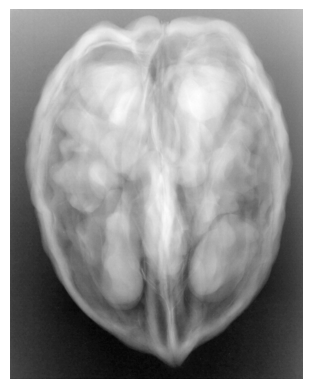

In [95]:
plt.imshow(projs[257], cmap=plt.cm.gray_r)
plt.axis("off")
plt.show()

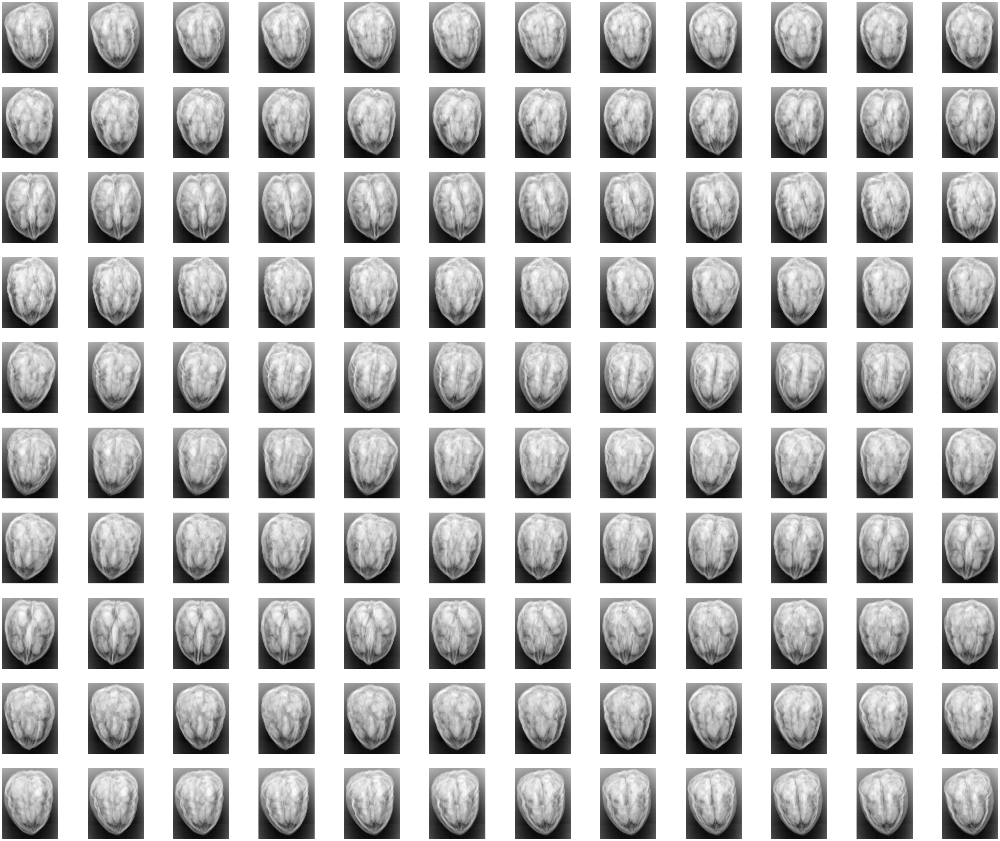

In [96]:
def plot_projs(projs, num_column=12, jump=10):
    num_slices = projs.shape[0]
    num_row = (num_slices//jump + num_column - 1) // num_column
    f, plots = plt.subplots(num_row, num_column, figsize=(num_column*5, num_row*5))
    for i in range(0, num_row*num_column):
        plot = plots[i % num_column] if num_row == 1 else plots[i // num_column, i % num_column]        
        plot.axis('off')
        if i < num_slices//jump:
            plot.imshow(projs[i*jump], cmap=plt.cm.gray_r)

plot_projs(projs)

In [97]:
np.save("./data/projs.npy", projs)

In [98]:
import sys

def write_pfm(data, fpath, scale=1, file_identifier=b'Pf', dtype="float32"):
    # PFM format definition: http://netpbm.sourceforge.net/doc/pfm.html

    data = np.flipud(data)
    height, width = np.shape(data)[:2]
    values = np.ndarray.flatten(np.asarray(data, dtype=dtype))
    endianess = data.dtype.byteorder
    print(endianess)

    if endianess == '<' or (endianess == '=' and sys.byteorder == 'little'):
        scale *= -1

    with open(fpath, 'wb') as file:
        file.write((file_identifier))
        file.write(('\n%d %d\n' % (width, height)).encode())
        file.write(('%d\n' % scale).encode())

        file.write(values) 

write_pfm(projs[0], "./data/test.txt")

=


## Reconstruction: 2D View

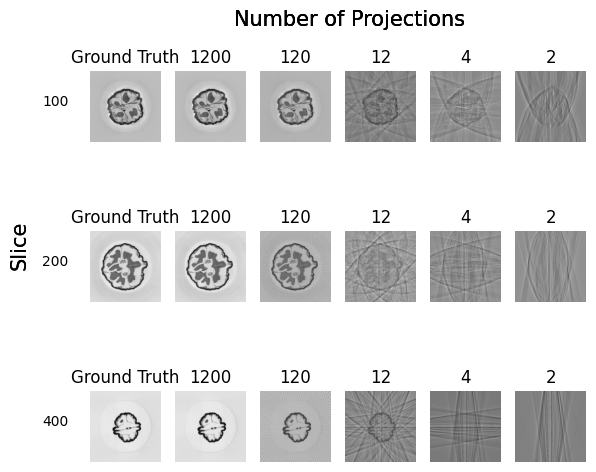

In [76]:
def plot_recons(sliceLst, assLst):
    walnut_id = 1
    orbit_id = 1
    slice_id = 278
    angluar_sub_sampling = 10
    voxel_per_mm = 10
    ROOT = 'D:/datasets/Walnuts/'

    prefix = os.path.join(ROOT, f"Walnut{walnut_id}")
    load_file = lambda file: np.array(imread(file))
    nrows = len(sliceLst)
    ncols = len(assLst) + 1
    fig = plt.figure()
    subfigures = fig.subfigures(nrows)
    for i, slice_id in enumerate(sliceLst):
        subfigures[i].text(0.05, 0.5, f"{slice_id}")
        subfigures[i].text(0, 0.5, "Slice", transform=fig.transFigure, rotation=90, fontsize=15)
        subfigures[i].text(0.35, 1, "Number of Projections", transform=fig.transFigure, fontsize=15)
        axes = subfigures[i].subplots(1, ncols)
        slice_file = os.path.join(prefix, "Reconstructions", f'fdk_pos{orbit_id}_{slice_id:06}.tiff')
        axes[0].imshow(load_file(slice_file), cmap=plt.cm.gray_r)
        axes[0].set_title("Ground Truth")
        axes[0].axis("off")

        for j, ass in enumerate(assLst):
            own_slice_file = os.path.join(prefix, f"OwnReconstructions_{ass}", f'fdk_pos{orbit_id}_ass{ass}_vmm{voxel_per_mm}_{slice_id:06}.tiff')
            axes[j+1].imshow(load_file(own_slice_file), cmap=plt.cm.gray_r)
            axes[j+1].set_title(f"{1200//ass}")
            axes[j+1].axis("off")
    plt.show()

assLst = [1, 10, 100, 300, 600]
sliceLst = [100, 200, 400]
plot_recons(sliceLst, assLst)

## Reconstruction: 3D View

In [77]:
ROOT = 'D:/datasets/Walnuts/'
prefix = os.path.join(ROOT, f"Walnut{walnut_id}")
num_slices = 501
slice_files = [os.path.join(prefix, "Reconstructions", f'fdk_pos{orbit_id}_{i:06}.tiff') for i in range(500)]
load_file = lambda file: np.array(imread(file))
slice_shape = load_file(slice_files[0]).shape

slices = np.empty((num_slices, slice_shape[0], slice_shape[1]))
for i, slices_file in enumerate(slice_files):
    slices[i, :, :] = load_file(slices_file)


In [116]:
np.max(slices)

0.22842930257320404

In [78]:
import numpy as np
from skimage import measure, feature
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

def plot_3d(image, threshold=0.04):
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image.transpose(2,1,0)
    # p = p[:,:,::-1]
    
    verts, faces, normals, values = measure.marching_cubes(p, threshold)

    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], alpha=0.1)
    face_color = [0.5, 0.5, 1]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, p.shape[0])
    ax.set_ylim(0, p.shape[1])
    ax.set_zlim(0, p.shape[2])

    plt.show()

plot_3d(slices)